# Team 137: Recsys 137
## Sujay Thakur
## Simon Warchol
## Jovin Leong

___

This notebook contains the bulk of our code; it runs only when we have our augmented data in a nearby directory. We also include our code which we used to interact with the Spotify API; these code blocks have been commented out and the API keys have been hidden.

In [1]:
import pandas as pd
import numpy as np
import scipy
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt
import spotipy
import spotipy.util as util
%matplotlib inline

### Data collection
The following code reads data from the _Million Playlists Dataset_ and extracts the additional audio features used in our model. The code block has been commented out and the API IDs and secret are hidden.

In [2]:
## Code to extract song features from Spotipy;
## Commented out to avoid errors

# import os
# import sys
# from json.decoder import JSONDecodeError

# username="Hidden"
# client_id="Hidden"
# client_secret="Hidden"
# redirect_uri='https://google.com'

# try:
#     token = util.prompt_for_user_token(username=username, client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri)
# except (AttributeError, JSONDecodeError):
#     os.remove(f".cache-{username}")
#     token = util.prompt_for_user_token(username=username, client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri)

# spotify = spotipy.Spotify(auth=token)

# attrs=['danceability',
#   'energy',
#   'key',
#   'loudness',
#   'mode',
#   'speechiness',
#   'acousticness',
#   'instrumentalness',
#   'liveness',
#   'valence',
#   'tempo',
#   'type',
#   'id',
#   'uri',
#   'track_href',
#   'analysis_url',
#   'duration_ms',
#   'time_signature']

# start=int(sys.argv[1])
# end=int(sys.argv[2])
# songs=list(range(start, end))

# for song in songs:
#     df1 = pd.read_csv('Songs/songs{}.csv'.format(song))
#     for key in attrs:
#         df1[key]=0
        
#     i=0
#     j=99
#     ender=0
#     error=0

#     while ender==0:
#         if j>=df1.shape[0]:
#             j=df1.shape[0]
#             ender=1
#         try:
#             output = spotify.audio_features(tracks=df1.loc[i:j]['track_uri'].values)
#             for key in output[0]:
#                 df1.loc[i:j, key]=np.array([d[key] for d in output])
#             i=j+1
#             j+=100
        
#         except TypeError:
#             print('Error with File{} in section {}-{}'.format(song, i,j))
#             error=1
#             break

#     if error==0:  
#         export_csv = df1.to_csv ('songs_mod/songs{}.csv'.format(song))
#         print('Finished File {}'.format(song))


---

### Preprocessing
We read in the songs data, with all required attributes. We then prepare a Numpy array of the required numerical values, which is standardised to prevent any one attribute from dominating.

In [3]:
def preprocess_numeric(path):
    '''Read in songs CSV and output Numpy array of the numeric columns after standardising.'''
    df = pd.read_csv(path)
    df_numeric = df[['danceability','energy','loudness','speechiness','acousticness','instrumentalness',\
        'liveness','valence','tempo']]
    X_scaled = StandardScaler().fit_transform(df_numeric)
    
    return df, np.array(df_numeric), X_scaled

In [7]:
df, X_unscaled, X_train = preprocess_numeric('../test_data/songs620.csv')

---

### Visualisation
We can plot the correlation scatters for all attributes. Note that features like energy and loudness seem to feature collinearity. We can choose to deal with this by either dropping one of the attributes or by downscaling one.

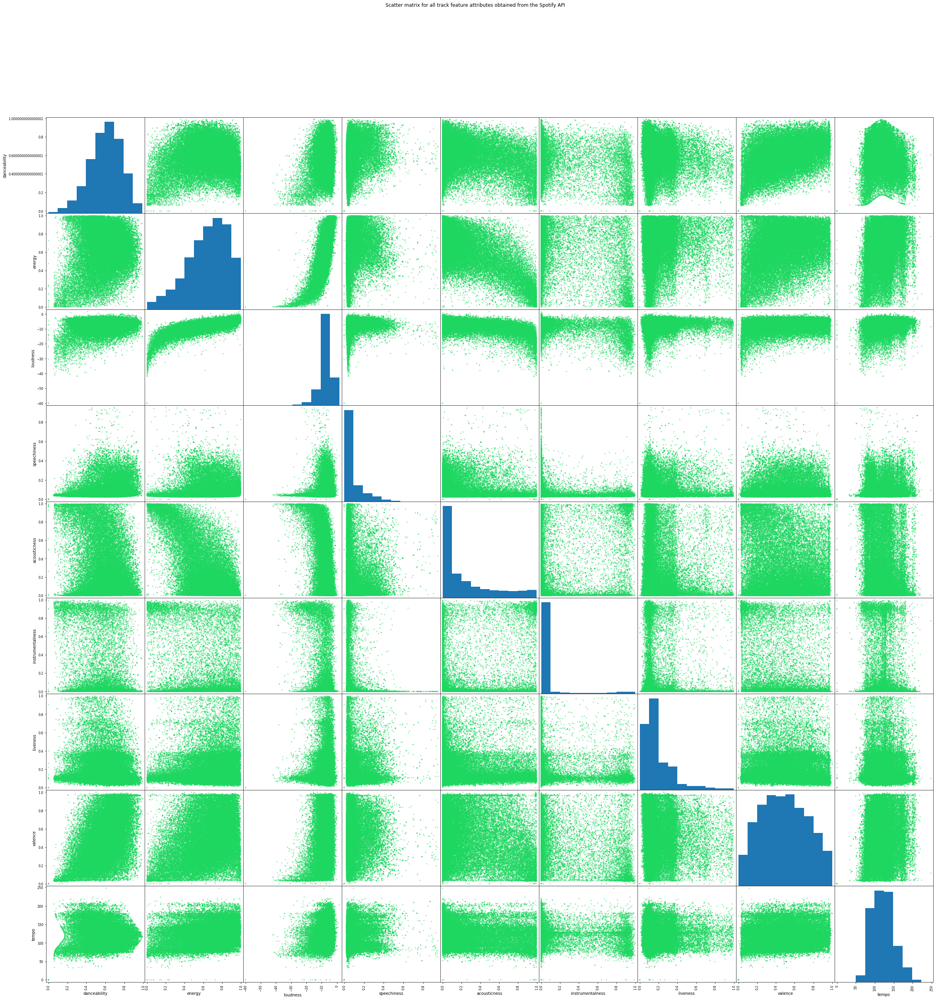

In [16]:
cor_columns = ['danceability','energy','loudness','speechiness','acousticness','instrumentalness',\
        'liveness','valence','tempo']
scatter_matrix(df[cor_columns], figsize=(40, 40), c="#1ED761")
plt.suptitle("Scatter matrix for all track feature attributes obtained from the Spotify API")
plt.show()

Since the data has already been standardised, we can also compute the PCA vectors and visualise all pairs in a matrix. This would give some intuition for the number of clusters we might expect in the data.

In [10]:
pca=PCA().fit(X_train)
pca_X_train=pca.transform(X_train)

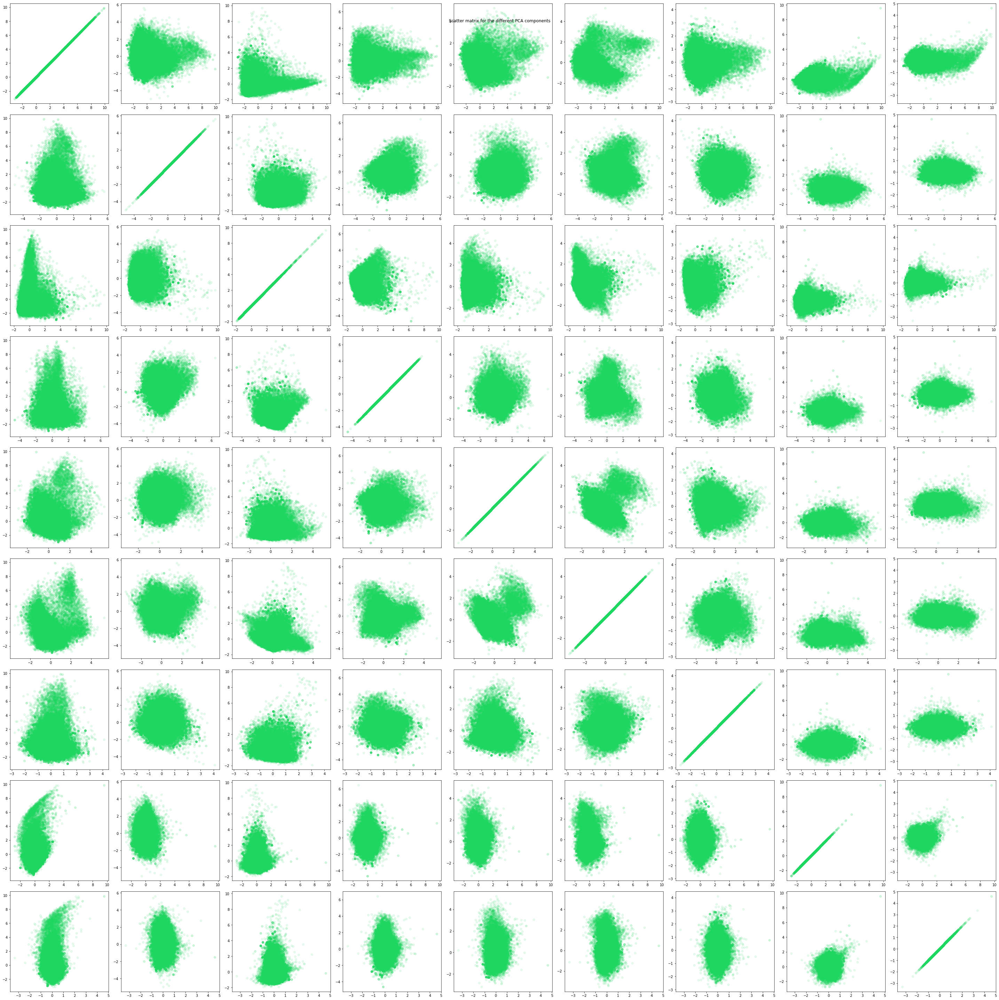

In [21]:
fig, ax=plt.subplots(9,9, figsize=(40,40))
for i in range(9):
    for j in range(9):
        ax[i,j].scatter(pca_X_train[:,i], pca_X_train[:,j], alpha=0.1, c="#1ED761")

plt.suptitle("Scatter matrix for the different PCA components")
plt.tight_layout()
plt.show()

We see roughly 3 clusters, and can now fit these using K-means to get some intuition. We note that the learned cluster centers correspond correctly to the 3 clusters we visually saw in the PCA projections.

In [19]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(PCA().fit_transform(X_unscaled))
pd.value_counts(kmeans.labels_)

2    29653
1    24675
0    11935
dtype: int64

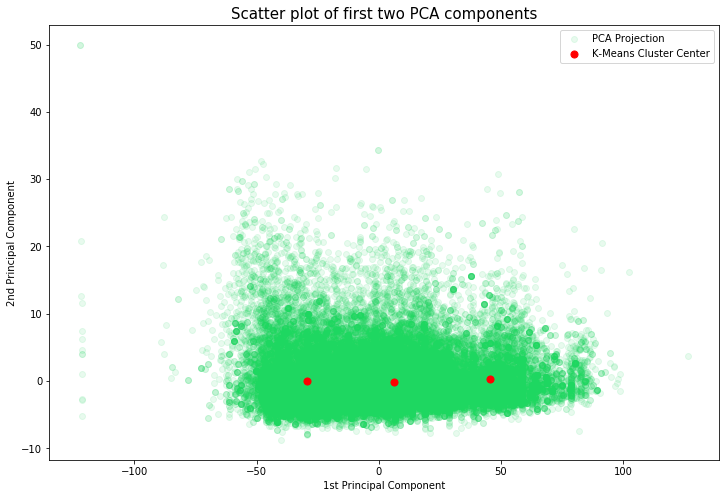

In [21]:
plt.figure(figsize=(12,8))
plt.scatter(PCA().fit_transform(X_unscaled)[:,0], PCA().fit_transform(X_unscaled)[:,1], alpha=0.1, c="#1ED761", label='PCA Projection')
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:,1], c='r', s=50, label='K-Means Cluster Center')
plt.xlabel('1st Principal Component')
plt.ylabel('2nd Principal Component')
plt.title('Scatter plot of first two PCA components', fontsize=15)
plt.legend()
plt.savefig('fig_3.png')

### Recommendations based on Gaussian Mixture Models and Nearest Neighbours
Note that when a user indicates that they like a song, we only focus on the playlists that the song is a part of. We can fit a GMM and NN to this data. This allows us to generate recommendations based on two techniques.

**GMM**: We can fit the data to the chosen number of clusters we expect. Then, when the user likes a song, we can infer the posterior $p(z_n|x_n)$ to select the cluster that the song belongs to. We can then sample $p(x_n|z_n)$ to generate a new song from that cluster. Since this sample from a multivariate Gaussian may not exactly correspond to a song, we can use our pre-trained NN to find the closest match.

**NN**: We can simply run unsupervised NN on the data and recommend the $k$ closest songs corresponding to the song that the user likes.

Note that we would expect NN to generate recommendations closer to the song input, since it is literally picking songs closest to the input, whereas GMM would recommend songs in the same cluster but potentially far away from the input. Our system could use both techniques together, with NN suggesting relevant similar songs and GMM suggesting relevant 'exploratory' songs for the user to better explore that cluster.

In [5]:
def recommend(song_input, songs_np, songs_df, num_recommend_gmm, num_recommend_nn, gmm_clusters=8):
    '''Generates song recommendations based on Nearest Neighbours and GMM sampling.
    
    Inputs
    
    song_inputs: Index of song that user likes.
    songs_np: Numpy array of numeric attributes of dataset.
    songs_df: Full dataframe
    
    num_recommend_nn: Number of songs to recommend using NN.
    num_recommend_gmm: Number of songs to recommend using GMM sampling.
    gmm_clusters: Number of clusters for GMM.
    
    Outputs
    
    idx: Indices corresponding to data subset for playlists that contain query song.
    gmm_recc: num_recommend_gmm Numpy array containing indices of the recommended songs using GMM.
    nn_recc: num_recommend_nn Numpy array containing indices of the recommended songs using NN.
    '''
    
    query_song = songs_np[song_input]
    playlist_idx = songs_df[songs_df['track_uri'] == songs_df.iloc[song_input]['track_uri']]['pid'].values
    query_songs_df = songs_df[songs_df['pid'].isin(playlist_idx)]
    idx = query_songs_df.drop_duplicates(subset=['track_uri']).index.values
    query_songs_np = songs_np[idx]
    
    gmm = GaussianMixture(n_components=gmm_clusters).fit(query_songs_np)
    nn = NearestNeighbors().fit(query_songs_np)
    
    #GMM sampling
    label_gmm = gmm.predict(query_song.reshape(1,-1))
    samples = np.random.multivariate_normal(gmm.means_[0], gmm.covariances_[0], num_recommend_gmm)
    dist, indices = nn.kneighbors(samples, n_neighbors=1)
    gmm_recc = indices.flatten()
        
    #NN
    dist, indices = nn.kneighbors(query_song.reshape(1,-1), n_neighbors=num_recommend_nn+1)
    nn_recc = indices[:,1:][0]
    
#     return gmm_recc, nn_recc
    return idx, nn_recc, gmm_recc

We now try this approach out on a random song from the dataset.

In [6]:
df.loc[[11997]]

,Unnamed: 0,pid,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,...,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,time_signature
11997,11997,185,59,A$AP Ferg,spotify:track:4dVpf9jZjcORqGTLUaeYj9,spotify:artist:5dHt1vcEm9qb8fCyLcB3HL,Plain Jane,spotify:album:0tQ7Iu6EicQTPyhYRNWjaT,173600,Still Striving,...,0.0,0.087,0.52,170.142,audio_features,4dVpf9jZjcORqGTLUaeYj9,spotify:track:4dVpf9jZjcORqGTLUaeYj9,https://api.spotify.com/v1/tracks/4dVpf9jZjcOR...,https://api.spotify.com/v1/audio-analysis/4dVp...,4


In [7]:
idx, nn_recc, gmm_recc = recommend(11997, X_train, df, 10, 10)

Inspecting the recommendations from both methods below, we see that this is in general, a good baseline model.

In [8]:
# GMM
df.iloc[idx].iloc[gmm_recc][['track_name', 'artist_name']]

,track_name,artist_name
49739,Confess,Logic
11993,The Way Life Goes (feat. Oh Wonder),Lil Uzi Vert
49786,Not The Same,KYLE
19221,Taking My Ball,Eminem
19274,Candy Paint,Post Malone
9472,Same Drugs,Chance The Rapper
19274,Candy Paint,Post Malone
11993,The Way Life Goes (feat. Oh Wonder),Lil Uzi Vert
49756,Everybody Dies In Their Nightmares,XXXTENTACION
49817,Flex Like Ouu,Lil Pump


In [9]:
# NN
df.iloc[idx].iloc[nn_recc]

,Unnamed: 0,pid,pos,artist_name,track_uri,artist_uri,track_name,album_uri,duration_ms,album_name,...,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,time_signature
9471,9471,150,73,Lil Uzi Vert,spotify:track:7GX5flRQZVHRAGd6B4TmDO,spotify:artist:4O15NlyKLIASxsJ0PrXPfz,XO TOUR Llif3,spotify:album:733e1ZfktLSwj96X5rsMeE,182707,Luv Is Rage 2,...,0.000000,0.1090,0.401,155.096,audio_features,7GX5flRQZVHRAGd6B4TmDO,spotify:track:7GX5flRQZVHRAGd6B4TmDO,https://api.spotify.com/v1/tracks/7GX5flRQZVHR...,https://api.spotify.com/v1/audio-analysis/7GX5...,4
19277,19277,281,77,Kodak Black,spotify:track:0bXFIF7iL17TYLyx8JHziM,spotify:artist:46SHBwWsqBkxI7EeeBEQG7,Patty Cake,spotify:album:5mG8oNkNKM2my7t9ywra96,198110,Painting Pictures,...,0.000000,0.0645,0.406,152.094,audio_features,0bXFIF7iL17TYLyx8JHziM,spotify:track:0bXFIF7iL17TYLyx8JHziM,https://api.spotify.com/v1/tracks/0bXFIF7iL17T...,https://api.spotify.com/v1/audio-analysis/0bXF...,4
19348,19348,281,148,A Boogie Wit da Hoodie,spotify:track:2vaMWMPMgsWX4fwJiKmdWm,spotify:artist:31W5EY0aAly4Qieq6OFu6I,Undefeated (feat. 21 Savage),spotify:album:3HHp5I6Q6SEyU5bkvoCtnV,174012,The Bigger Artist,...,0.000000,0.1580,0.631,169.857,audio_features,2vaMWMPMgsWX4fwJiKmdWm,spotify:track:2vaMWMPMgsWX4fwJiKmdWm,https://api.spotify.com/v1/tracks/2vaMWMPMgsWX...,https://api.spotify.com/v1/audio-analysis/2vaM...,4
11974,11974,185,36,Lil Uzi Vert,spotify:track:6j0teRL3WdExzqmy334sh5,spotify:artist:4O15NlyKLIASxsJ0PrXPfz,Seven Million (feat. Future),spotify:album:6LX75kNicFqjjiAOeZgN67,182491,The Perfect LUV Tape,...,0.000008,0.1210,0.487,158.002,audio_features,6j0teRL3WdExzqmy334sh5,spotify:track:6j0teRL3WdExzqmy334sh5,https://api.spotify.com/v1/tracks/6j0teRL3WdEx...,https://api.spotify.com/v1/audio-analysis/6j0t...,4
49866,49866,751,134,A$AP Mob,spotify:track:2rqUblDWJKlMVwh9uJc0Vv,spotify:artist:7yO4IdJjCEPz7YgZMe25iS,Yamborghini High,spotify:album:788rHiWVrWzM8dF7IiumCB,302004,Yamborghini High,...,0.000015,0.0779,0.635,137.767,audio_features,2rqUblDWJKlMVwh9uJc0Vv,spotify:track:2rqUblDWJKlMVwh9uJc0Vv,https://api.spotify.com/v1/tracks/2rqUblDWJKlM...,https://api.spotify.com/v1/audio-analysis/2rqU...,4
19252,19252,281,52,Gucci Mane,spotify:track:3yR1KKeveAUv39QiiPHwfo,spotify:artist:13y7CgLHjMVRMDqxdx0Xdo,Icy Lil Bitch,spotify:album:4A70XLIysm5lTaZYtCDveX,164720,WOPTOBER,...,0.000000,0.1270,0.524,155.964,audio_features,3yR1KKeveAUv39QiiPHwfo,spotify:track:3yR1KKeveAUv39QiiPHwfo,https://api.spotify.com/v1/tracks/3yR1KKeveAUv...,https://api.spotify.com/v1/audio-analysis/3yR1...,4
19258,19258,281,58,Big Sean,spotify:track:67W5fd1ld7dqHNCfaQu52I,spotify:artist:0c173mlxpT3dSFRgMO8XPh,Dance (A$$),spotify:album:3jQol8uDHmZIgqaVGogf37,197760,Finally Famous,...,0.044900,0.1300,0.700,159.865,audio_features,67W5fd1ld7dqHNCfaQu52I,spotify:track:67W5fd1ld7dqHNCfaQu52I,https://api.spotify.com/v1/tracks/67W5fd1ld7dq...,https://api.spotify.com/v1/audio-analysis/67W5...,4
49891,49891,751,159,A$AP Ferg,spotify:track:4gpmL5xSZeHssgyIP3UuPS,spotify:artist:5dHt1vcEm9qb8fCyLcB3HL,What Do You Do,spotify:album:0tQ7Iu6EicQTPyhYRNWjaT,176867,Still Striving,...,0.000016,0.0947,0.506,152.016,audio_features,4gpmL5xSZeHssgyIP3UuPS,spotify:track:4gpmL5xSZeHssgyIP3UuPS,https://api.spotify.com/v1/tracks/4gpmL5xSZeHs...,https://api.spotify.com/v1/audio-analysis/4gpm...,4
9440,9440,150,42,Chris Brown,spotify:track:0LWQWOFoz5GJLqcHk1fRO2,spotify:artist:7bXgB6jMjp9ATFy66eO08Z,Look At Me Now,spotify:album:6rEm9wAyZP79RFa2qW2bf7,222587,F.A.M.E.,...,0.000006,0.1440,0.538,146.155,audio_features,0LWQWOFoz5GJLqcHk1fRO2,spotify:track:0LWQWOFoz5GJLqcHk1fRO2,https://api.spotify.com/v1/tracks/0LWQWOFoz5GJ...,https://api.spotify.com/v1/audio-analysis/0LWQ...,4
19200,19200,281,0,The Weeknd,spotify:track:5aAx2yezTd8zXrkmtKl66Z,spotify:artist:1Xyo4u8uXC1ZmMpatF05PJ,Starboy,spotify:album:09fggMHib4YkOtwQNXEBII,230453,Starboy,...,0.000003,0.1340,0.535,186.054,audio_features,5aAx2yezTd8zXrkmtKl66Z,spotify:track:5aAx2yezTd8zXr

---

### Output and playlist generation

Our code for our baseline model is not depicted here; it is a combination of the above cells. Our code of generating playlists are below; we have a separate Python script where all processes are integrated and where we have a simple command line interface where users can input a single track and obtain a playlist within Spotify with song recommendations.

In [10]:
## As before, the code is commented out to avoid an error
## Builds playlists through Spotipy given a list of song recommendations

# try:
#     token = util.prompt_for_user_token(username=username, client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri, scope='playlist-modify')
# except (AttributeError, JSONDecodeError):
#     os.remove(f".cache-{username}")
#     token = util.prompt_for_user_token(username=username, client_id=client_id, client_secret=client_secret, redirect_uri=redirect_uri, scope=['playlist-modify', 'user-read-private'] )

# spotify = spotipy.Spotify(auth=token)


# new_playlist = spotify.user_playlist_create(username, 'Spotipy Test', public=True)

# results = spotify.user_playlist_add_tracks(username, new_playlist['id'], ['spotify:track:3zmduBNsQ6BPDTZAkXzG5K'])
